# Data Preparation

Run following code to download the data from [here](https://zenodo.org/record/1252143#.ZDQZhHbMJD9):

In [4]:
!wget https://zenodo.org/record/1252143/files/voiceHome-2_corpus_v1.0.zip

--2023-04-10 14:29:01--  https://zenodo.org/record/1252143/files/voiceHome-2_corpus_v1.0.zip
Resolving zenodo.org (zenodo.org)... 188.185.124.72
Connecting to zenodo.org (zenodo.org)|188.185.124.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2621330536 (2.4G) [application/octet-stream]
Saving to: ‘voiceHome-2_corpus_v1.0.zip’

voiceHome-2_corpus_ 100%[===================>]   2.44G  1.07MB/s    in 16m 44s 

2023-04-10 14:45:46 (2.49 MB/s) - ‘voiceHome-2_corpus_v1.0.zip’ saved [2621330536/2621330536]



Extract data to data folder:

In [5]:
!unzip voiceHome-2_corpus_v1.0.zip -d data

Streaming output truncated to the last 5000 lines.
 extracting: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_noiseCond4.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerF1_speakerPos1.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerF1_speakerPos2.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerF1_speakerPos3.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerF1_speakerPos4.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerF1_speakerPos5.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerM1_speakerPos1.txt  
 extracting: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerM1_speakerPos2.txt  
 extracting: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room1_speakerM1_speakerPos3.txt  
  inflating: data/voiceHome-2_corpus_1.0/annotations/rooms/home1_room

# Preparation

Install required libraries:

In [1]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T
from IPython.display import Audio
print("Using torch", torch.__version__)

Using torch 2.0.0+cu118


Set seed for reproducibility and select device:

In [2]:
SEED = 42
torch.manual_seed(SEED) # Setting the seed
torch.random.manual_seed(SEED)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print("Device", device)
# GPU operations have a separate seed we also want to set
if torch.cuda.is_available(): 
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
    
# Additionally, some operations on a GPU are implemented stochastic for efficiency
# We want to ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Device cpu


# Missing Audio Data Completion Pipleine

The pipeline does the following steps:
1.   load path of all audio files from specified split(clean. noisy,or spontaneous)
2.   for each audio file, load meta_data and audio
3.   extract spectogram from raw audio file
4.   apply time and frequency mask
5.   apply tensor completion algorithm
6.   reconstruct audio from the constructed spectogram
7.   calculate loss






## Main functions

In [3]:
n_fft = 1024
win_length = None
hop_length = 512

def load_audio(path):
  metadata = torchaudio.info(path)
  print(metadata)
  waveform, sample_rate = audio = torchaudio.load(path)
  return waveform,sample_rate


# Define transform
spectrogram = torchaudio.transforms.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)

def convert_sig_to_spectogram(signal):
  spec = spectrogram(signal)
  return spec


griffin_lim = T.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)
def convert_spectogram_to_signal(spec):
  reconstructed_waveform = griffin_lim(spec)
  return reconstructed_waveform


def mask_time(spec,maksed_channels,number_of_missing_blocks=1):
  t_masking = T.TimeMasking(time_mask_param=80)
  for i in range(number_of_missing_blocks):
    spec[maksed_channels] = t_masking(spec[maksed_channels])
  return spec


def mask_frequency(spec,maksed_channels,number_of_missing_blocks=1):
  f_masking = T.FrequencyMasking(freq_mask_param=80)
  for i in range(number_of_missing_blocks):
    spec[maksed_channels] = f_masking(spec[maksed_channels])
  return spec



## Visualization Functions

In [8]:
import matplotlib.pyplot as plt
import librosa

def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)


def plot_spectrogram(specgram, title=None, ylabel="freq_bin"):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or "Spectrogram (db)")
    axs.set_ylabel(ylabel)
    axs.set_xlabel("frame")
    im = axs.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto")
    fig.colorbar(im, ax=axs)
    plt.show(block=False)

def plot_spectrograms(specgram, title=None, ylabel="freq_bin"):
  n_channel= specgram.shape[0]
  for channel_id in range(n_channel):
    plot_spectrogram(specgram[channel_id], title=f"{title}: channel {channel_id}")


##Main Script

In [9]:
def complete_data_pipeline(path, alg_func, number_of_masked_channels,number_of_missing_blocks=None, mask_time_enabled=True, mask_frequency_enabled=True, visualize=False):
  
  # load audio
  sig, sampling_rate= load_audio(path)

  #  convert  audio signal to spectogram
  spec = convert_sig_to_spectogram(sig)

  #  randomely choose number of channels to be masked
  missing_spec = spec.detach().clone()
  n_channel= spec.shape[0]
  if (number_of_missing_blocks is None) or number_of_missing_blocks> n_channel :
    # if  number_of_missing_blocks is not specified, apply the masking on all channels
    number_of_missing_blocks= n_channel
  maksed_channels= torch.randperm(n_channel)[:number_of_masked_channels]

  #  apply time and frequency masking if specified
  if mask_time_enabled:
    missing_spec = mask_time(missing_spec,maksed_channels,number_of_missing_blocks)
  if mask_frequency_enabled:
    missing_spec = mask_frequency(missing_spec,maksed_channels,number_of_missing_blocks)

  
  # complete the missing tensor
  # TODO: be impleneted
  # reconstructed_spec= alg_func(missing_spec)
  # This code is only for making pipleline works, it should be replaced by calling actual function 
  reconstructed_spec= spec.detach().clone()

  # convert the constructed spectogram to the signal
  reconstructed_sig= convert_spectogram_to_signal(reconstructed_spec)

  if visualize:
    # visualize the spectograms
    plot_spectrograms(spec,title="Original  Spectogram")
    plot_spectrograms(missing_spec,title="Masked  Spectogram")
    plot_spectrograms(reconstructed_spec,title="Imputed  Spectogram")


  return sig, reconstructed_sig,reconstructed_spec



# Experiments

In [14]:
SPLIT='noisy'
SAMPLE_RATE= 16000
NUMBER_OF_SAMPLES=1 #number of data to be considered

There exists 1440 audio files in noisy folder.
--------------------------------------- Start completeing tensor for audio: ./data/voiceHome-2_corpus_1.0/audio/noisy/home2_room1_arrayGeo1_arrayPos1_speakerM4_speakerPos2_noiseCond13_uttNum415.wav ---------------------------------------
AudioMetaData(sample_rate=16000, num_frames=168243, num_channels=8, bits_per_sample=16, encoding=PCM_S)


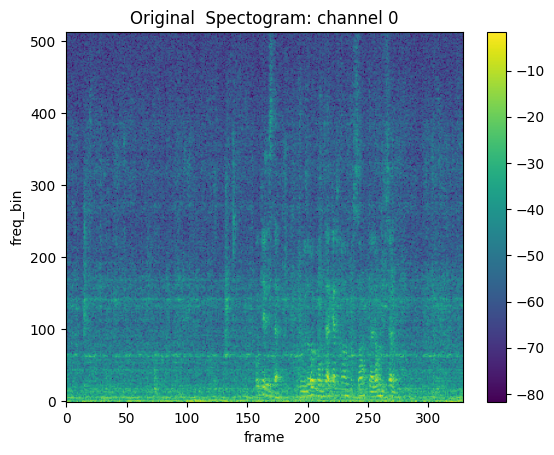

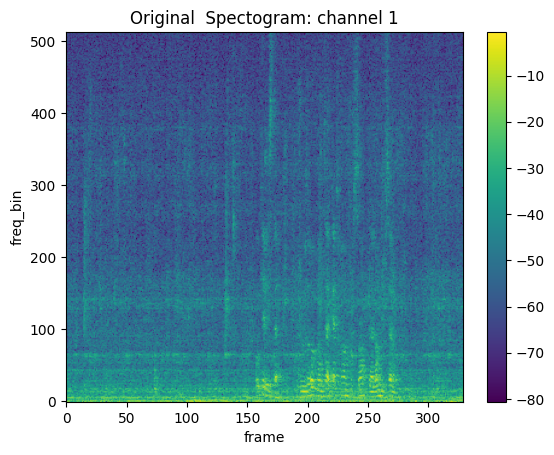

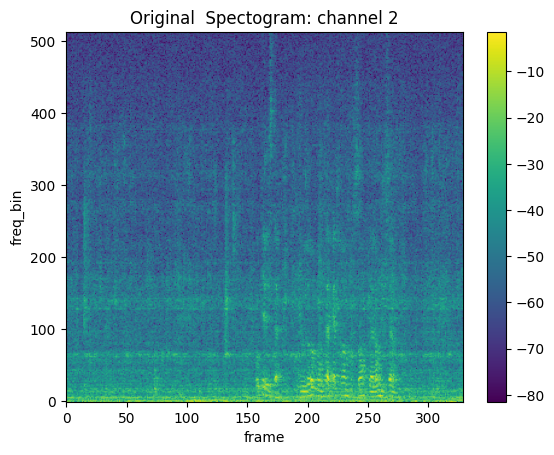

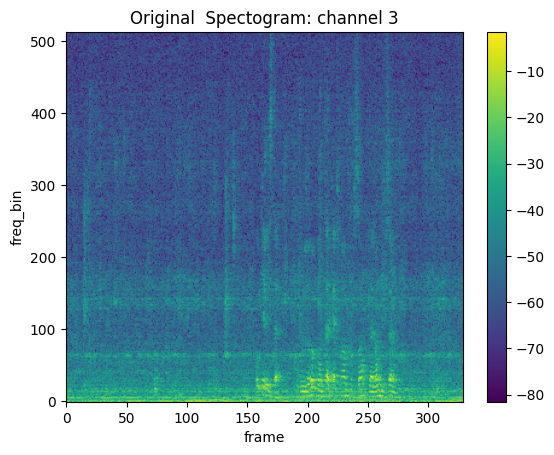

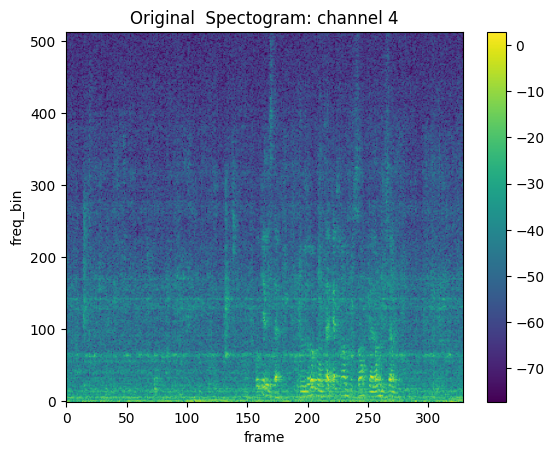

...

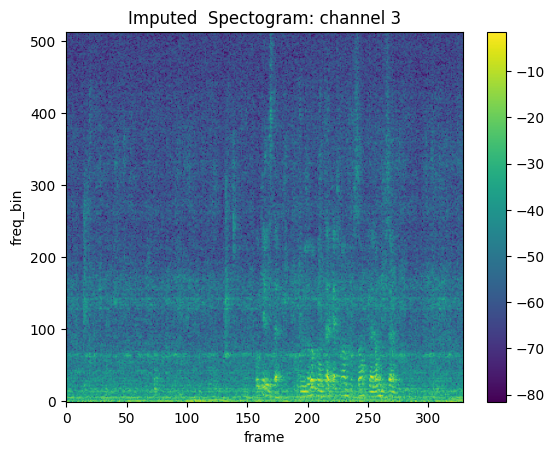

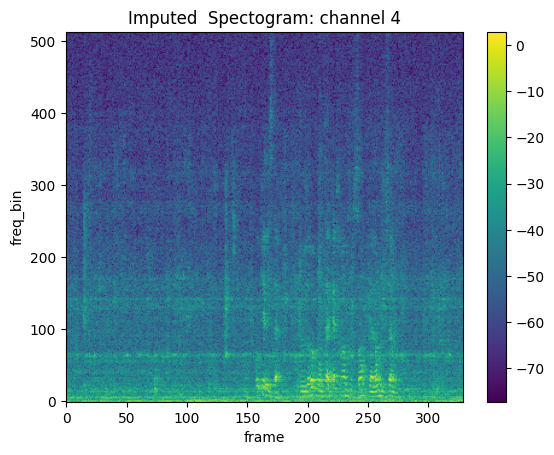

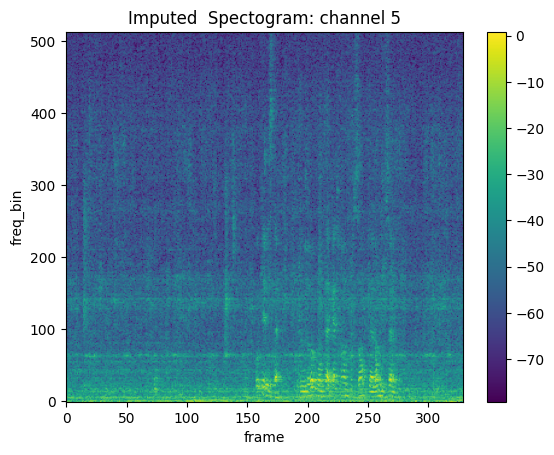

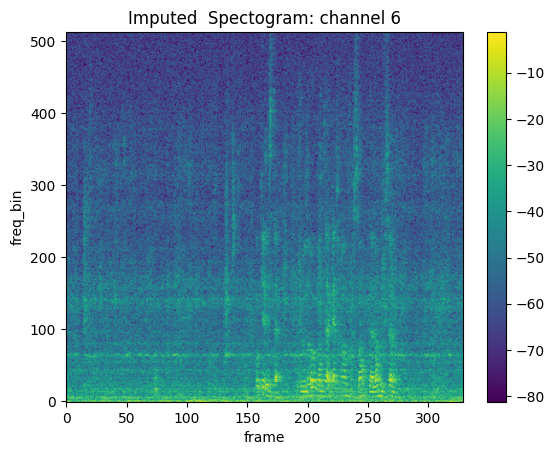

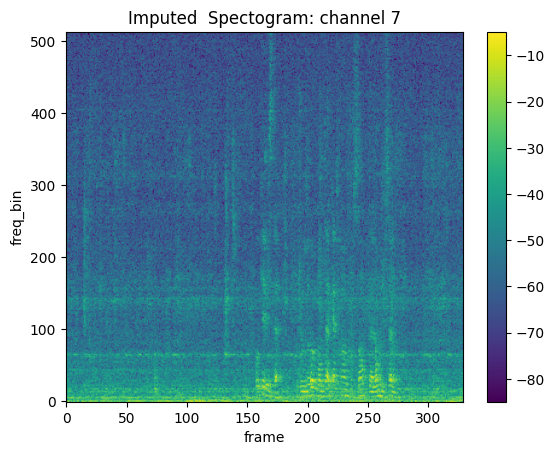

ValueError: ignored

In [16]:
import glob
import pathlib
import os


#  get all audio path 
paths= glob.glob(os.path.join('./data/voiceHome-2_corpus_1.0/audio',SPLIT,'*.wav'))
print(f"There exists {len(paths)} audio files in {SPLIT} folder.")
visualize =True
paths=paths[:NUMBER_OF_SAMPLES]
for path in paths:
  print(f"--------------------------------------- Start completeing tensor for audio: {path} ---------------------------------------")
  sig, reconstructed_sig, reconstructed_spec= complete_data_pipeline(path, "TT", number_of_masked_channels=3, number_of_missing_blocks=2, mask_time_enabled=True, mask_frequency_enabled=True, visualize=visualize)
  # visualize the audio signals only for first channel
  if visualize:
    print("--------------------------------------- Original Audio ---------------------------------------")
    plot_waveform(sig[0].unsqueeze(0),SAMPLE_RATE,title="Original waveform")
      
    print("--------------------------------------- Imputed Audio Audio  ---------------------------------------")
    Audio(reconstructed_sig.numpy()[0], rate=SAMPLE_RATE)
    plot_waveform(reconstructed_sig[0].unsqueeze(0),SAMPLE_RATE,title="Imputed waveform")

Play the last processed audio file

In [12]:
print("--------------------------------------- Original Audio ---------------------------------------")
Audio(sig.numpy()[0], rate=SAMPLE_RATE)      

--------------------------------------- Original Audio ---------------------------------------


In [13]:
print("--------------------------------------- Imputed Audio Audio  ---------------------------------------")
Audio(reconstructed_sig.numpy()[0], rate=SAMPLE_RATE)

--------------------------------------- Imputed Audio Audio  ---------------------------------------
